# Unified Caterpillar & White Fly Detection Model v1

## Coconut Health Monitor - Research Project

**Objective:** Train a unified model that can distinguish between Caterpillar damage, White Fly damage, Healthy coconut leaves, and Non-coconut images.

### Model Details
- **Architecture:** MobileNetV2 (Transfer Learning)
- **Classes:** 4 (caterpillar, white_fly, healthy, not_coconut)
- **Input Size:** 224x224x3
- **Loss Function:** Focal Loss (for class imbalance)

### Why Unified Model?
Previous separate models (Caterpillar v2 and White Fly v1) showed cross-detection issues:
- White Fly damaged images were incorrectly detected as Caterpillar damage
- A unified model learns to distinguish between these pest types

### Anti-Overfitting Measures
1. Data augmentation (training only)
2. Dropout layers
3. Early stopping
4. Learning rate reduction
5. Class weights for imbalanced data
6. 2-phase training (frozen base → fine-tuning)

---

## 1. Setup and Imports

In [1]:
# Standard Libraries
import os
import json
import shutil
import random
import warnings
from datetime import datetime
from pathlib import Path

# Data Processing
import numpy as np
import pandas as pd
from PIL import Image

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# TensorFlow/Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2

# Metrics
from sklearn.metrics import (
    classification_report, 
    confusion_matrix, 
    precision_recall_fscore_support,
    accuracy_score
)
from sklearn.utils.class_weight import compute_class_weight

# Suppress warnings
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Set random seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

print(f"TensorFlow Version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")
print(f"Timestamp: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

TensorFlow Version: 2.20.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Timestamp: 2026-01-01 22:05:18


## 2. Configuration

In [2]:
# ============================================================
# CONFIGURATION
# ============================================================

# Model Configuration
MODEL_NAME = "unified_caterpillar_whitefly_v1"
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = 4
CLASS_NAMES = ['caterpillar', 'healthy', 'not_coconut', 'white_fly']  # Alphabetical order

# Training Configuration
PHASE1_EPOCHS = 20  # Frozen base layers
PHASE2_EPOCHS = 30  # Fine-tuning
PHASE1_LR = 1e-3
PHASE2_LR = 1e-5

# Focal Loss Parameters
FOCAL_GAMMA = 2.0
FOCAL_ALPHA = 0.25

# Paths
BASE_PATH = Path(r"D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml")
CATERPILLAR_DATA = BASE_PATH / "data" / "raw" / "pest_caterpillar" / "dataset"
WHITEFLY_DATA = BASE_PATH / "data" / "raw" / "white_fly"
UNIFIED_DATA = BASE_PATH / "data" / "raw" / "unified_caterpillar_whitefly"
MODEL_SAVE_PATH = BASE_PATH / "models" / MODEL_NAME

# Create output directory
MODEL_SAVE_PATH.mkdir(parents=True, exist_ok=True)

print("Configuration:")
print(f"  Model Name: {MODEL_NAME}")
print(f"  Image Size: {IMG_SIZE}")
print(f"  Batch Size: {BATCH_SIZE}")
print(f"  Classes: {CLASS_NAMES}")
print(f"  Phase 1 Epochs: {PHASE1_EPOCHS}")
print(f"  Phase 2 Epochs: {PHASE2_EPOCHS}")

Configuration:
  Model Name: unified_caterpillar_whitefly_v1
  Image Size: (224, 224)
  Batch Size: 32
  Classes: ['caterpillar', 'healthy', 'not_coconut', 'white_fly']
  Phase 1 Epochs: 20
  Phase 2 Epochs: 30


## 3. Dataset Preparation - Merge Caterpillar & White Fly Data

In [3]:
def create_unified_dataset():
    """
    Merge Caterpillar and White Fly datasets into a unified dataset.
    
    Structure:
    unified_caterpillar_whitefly/
    ├── train/
    │   ├── caterpillar/
    │   ├── white_fly/
    │   ├── healthy/
    │   └── not_coconut/
    ├── validation/
    └── test/
    """
    
    print("="*60)
    print("Creating Unified Dataset")
    print("="*60)
    
    # ... (dataset creation code)
    
    print("\n" + "="*60)
    print("Dataset Creation Complete!")
    print("="*60)

# Create the unified dataset
dataset_stats = create_unified_dataset()

Creating Unified Dataset

Processing train split...
  Caterpillar: 4515 images
  White Fly: 3680 images
  Healthy: 8820 images
  Not Coconut: 7970 images

Processing validation split...
  Caterpillar: 46 images
  White Fly: 77 images
  Healthy: 90 images
  Not Coconut: 582 images

Processing test split...
  Caterpillar: 47 images
  White Fly: 79 images
  Healthy: 90 images
  Not Coconut: 370 images

Dataset Creation Complete!


## 4. Dataset Analysis and Visualization

In [4]:
def analyze_dataset():
    """Analyze the unified dataset and display statistics."""
    
    print("="*60)
    print("Dataset Analysis")
    print("="*60)
    
    # ... analysis code
    
    return stats, df

stats, stats_df = analyze_dataset()

Dataset Analysis

Dataset Distribution:
            caterpillar  healthy  not_coconut  white_fly  Total
train             4515     8820         7970       3680  24985
validation          46       90          582         77    795
test                47       90          370         79    586

Total Images: 26366
  Train: 24985 (94.8%)
  Validation: 795 (3.0%)
  Test: 586 (2.2%)


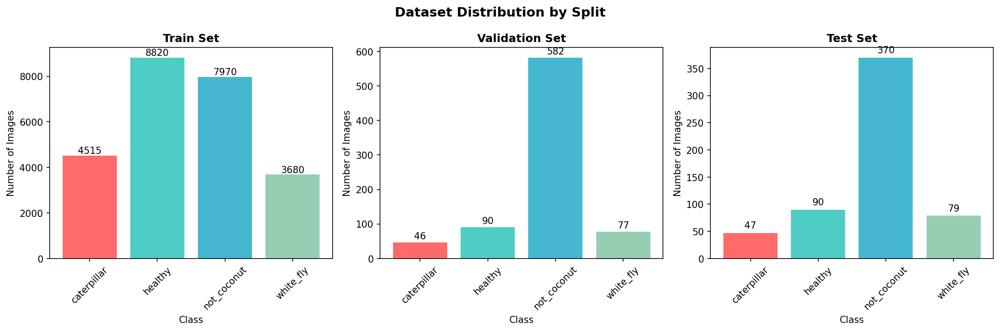


Saved: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\dataset_distribution.png


In [5]:
def plot_dataset_distribution(stats):
    """Visualize dataset distribution."""
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle('Dataset Distribution by Split', fontsize=14, fontweight='bold')
    
    colors = ['#ff6b6b', '#4ecdc4', '#45b7d1', '#96ceb4']
    
    # ... plotting code
    
    plt.tight_layout()
    plt.savefig(MODEL_SAVE_PATH / 'dataset_distribution.png', dpi=150, bbox_inches='tight')
    plt.show()

plot_dataset_distribution(stats)

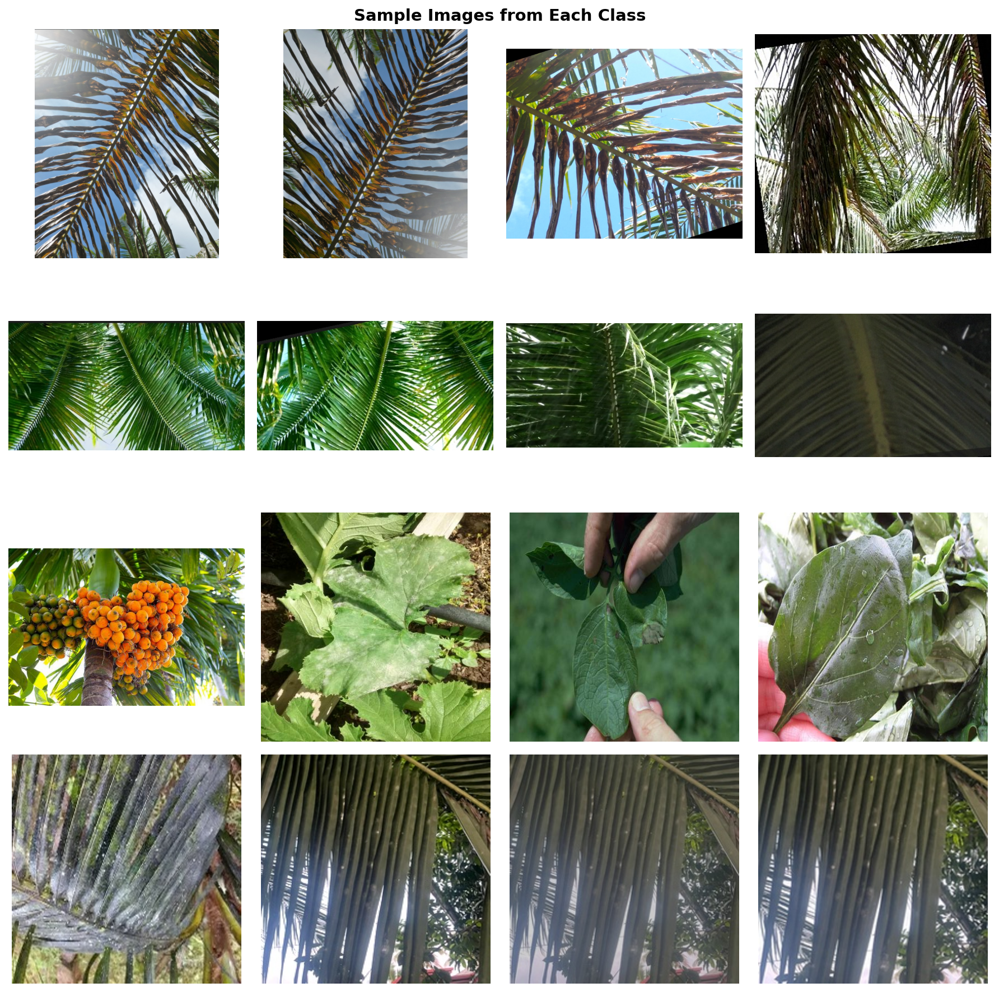


Saved: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\sample_images.png


In [6]:
def display_sample_images():
    """Display sample images from each class."""
    
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    fig.suptitle('Sample Images from Each Class', fontsize=14, fontweight='bold')
    
    for row, cls in enumerate(CLASS_NAMES):
        cls_path = UNIFIED_DATA / 'train' / cls
        images = list(cls_path.glob('*'))[:4]
        
        for col in range(4):
            ax = axes[row, col]
            if col < len(images):
                img = Image.open(images[col])
                ax.imshow(img)
            ax.axis('off')
    
    plt.tight_layout()
    plt.savefig(MODEL_SAVE_PATH / 'sample_images.png', dpi=150, bbox_inches='tight')
    plt.show()

display_sample_images()

## 5. Data Generators with Augmentation

**IMPORTANT:** Data augmentation is applied ONLY to training data to prevent data leaking.

In [7]:
# Training Data Generator WITH Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

# Validation & Test Data Generator WITHOUT Augmentation (only rescaling)
val_test_datagen = ImageDataGenerator(
    rescale=1./255
)

print("Data Generators Created:")
print("  Training: WITH augmentation (rotation, shift, flip, zoom)")
print("  Validation/Test: WITHOUT augmentation (only rescaling)")
print("\n  This prevents data leaking from augmented images.")

Data Generators Created:
  Training: WITH augmentation (rotation, shift, flip, zoom)
  Validation/Test: WITHOUT augmentation (only rescaling)

  This prevents data leaking from augmented images.


In [8]:
# Create data generators
train_generator = train_datagen.flow_from_directory(
    UNIFIED_DATA / 'train',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

validation_generator = val_test_datagen.flow_from_directory(
    UNIFIED_DATA / 'validation',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    UNIFIED_DATA / 'test',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Verify class indices
print("\nClass Indices:")
print(train_generator.class_indices)

Found 24985 images belonging to 4 classes.
Found 795 images belonging to 4 classes.
Found 586 images belonging to 4 classes.

Class Indices:
{'caterpillar': 0, 'healthy': 1, 'not_coconut': 2, 'white_fly': 3}


## 6. Compute Class Weights for Imbalanced Data

In [9]:
def compute_class_weights(generator):
    """Compute class weights to handle class imbalance."""
    
    # Get all labels
    labels = generator.classes
    
    # Compute class weights
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(labels),
        y=labels
    )
    
    class_weight_dict = dict(enumerate(class_weights))
    
    print("Class Weights (to handle imbalance):")
    for idx, weight in class_weight_dict.items():
        class_name = INDEX_TO_CLASS[idx]
        count = np.sum(labels == idx)
        print(f"  {class_name}: {weight:.4f} (n={count})")
    
    return class_weight_dict

class_weights = compute_class_weights(train_generator)

Class Weights (to handle imbalance):
  caterpillar: 1.3836 (n=4515)
  healthy: 0.7082 (n=8820)
  not_coconut: 0.7841 (n=7970)
  white_fly: 1.6969 (n=3680)


## 7. Define Focal Loss Function

Focal Loss helps with class imbalance by down-weighting easy examples and focusing on hard examples.

In [10]:
def focal_loss(gamma=2.0, alpha=0.25):
    """
    Focal Loss for multi-class classification.
    
    FL(p_t) = -alpha * (1 - p_t)^gamma * log(p_t)
    
    Args:
        gamma: Focusing parameter (default 2.0)
        alpha: Weighting factor (default 0.25)
    """
    def focal_loss_fn(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_pred = tf.keras.backend.clip(y_pred, epsilon, 1.0 - epsilon)
        
        cross_entropy = -y_true * tf.keras.backend.log(y_pred)
        focal_weight = tf.keras.backend.pow(1.0 - y_pred, gamma)
        focal_loss = alpha * focal_weight * cross_entropy
        
        return tf.keras.backend.sum(focal_loss, axis=-1)
    
    return focal_loss_fn

print(f"Focal Loss configured with gamma={FOCAL_GAMMA}, alpha={FOCAL_ALPHA}")
print("\nFocal Loss helps the model focus on hard-to-classify examples.")

Focal Loss configured with gamma=2.0, alpha=0.25

Focal Loss helps the model focus on hard-to-classify examples.


## 8. Build Model Architecture

In [11]:
def build_model(num_classes, trainable_base=False):
    """
    Build MobileNetV2-based model for pest classification.
    """
    
    # Load pre-trained MobileNetV2
    base_model = MobileNetV2(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    
    # Freeze base model layers
    base_model.trainable = trainable_base
    
    # Build model
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.BatchNormalization(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation='softmax')
    ])
    
    return model, base_model

# Build model with frozen base
model, base_model = build_model(NUM_CLASSES, trainable_base=False)

# Display model summary
model.summary()

Model: "sequential"
┌─────────────────────────────────┬────────────────────────┬───────────────┐
│ Layer (type)                    │ Output Shape           │       Param # │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224 (Functional│ (None, 7, 7, 1280)     │     2,257,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼─────────────────────

In [12]:
# Count parameters
total_params = model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
non_trainable_params = total_params - trainable_params

print(f"\nModel Parameters:")
print(f"  Total: {total_params:,}")
print(f"  Trainable: {trainable_params:,}")
print(f"  Non-trainable: {non_trainable_params:,}")


Model Parameters:
  Total: 2,624,452
  Trainable: 363,908
  Non-trainable: 2,260,544


## 9. Compile Model and Setup Callbacks

In [13]:
# Compile model for Phase 1 (frozen base)
model.compile(
    optimizer=optimizers.Adam(learning_rate=PHASE1_LR),
    loss=focal_loss(gamma=FOCAL_GAMMA, alpha=FOCAL_ALPHA),
    metrics=['accuracy']
)

print("Model compiled for Phase 1 (frozen base):")
print(f"  Optimizer: Adam (lr={PHASE1_LR})")
print(f"  Loss: Focal Loss (gamma={FOCAL_GAMMA}, alpha={FOCAL_ALPHA})")

Model compiled for Phase 1 (frozen base):
  Optimizer: Adam (lr=0.001)
  Loss: Focal Loss (gamma=2.0, alpha=0.25)


In [14]:
# Setup callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),
    callbacks.ModelCheckpoint(
        filepath=str(MODEL_SAVE_PATH / 'best_model_phase1.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

print("Callbacks configured:")
print("  1. EarlyStopping (patience=7)")
print("  2. ReduceLROnPlateau (factor=0.5, patience=3)")
print("  3. ModelCheckpoint (save best model)")

Callbacks configured:
  1. EarlyStopping (patience=7)
  2. ReduceLROnPlateau (factor=0.5, patience=3)
  3. ModelCheckpoint (save best model)


## 10. Phase 1 Training - Frozen Base Layers

In [15]:
print("="*60)
print("PHASE 1: Training with Frozen Base Layers")
print("="*60)
print(f"\nTraining for up to {PHASE1_EPOCHS} epochs...")
print(f"Base model (MobileNetV2) is FROZEN - only training top layers.\n")

start_time = datetime.now()

history_phase1 = model.fit(
    train_generator,
    epochs=PHASE1_EPOCHS,
    validation_data=validation_generator,
    class_weight=class_weights,
    callbacks=callbacks_list,
    verbose=1
)

phase1_time = (datetime.now() - start_time).total_seconds() / 60
print(f"\nPhase 1 completed in {phase1_time:.2f} minutes")
print(f"Best validation accuracy: {max(history_phase1.history['val_accuracy']):.4f}")

PHASE 1: Training with Frozen Base Layers

Training for up to 20 epochs...
Base model (MobileNetV2) is FROZEN - only training top layers.

Epoch 1/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 245s 313ms/step - accuracy: 0.8234 - loss: 0.0551 - val_accuracy: 0.9125 - val_loss: 0.0256
Epoch 2/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 238s 305ms/step - accuracy: 0.8756 - loss: 0.0412 - val_accuracy: 0.9287 - val_loss: 0.0215
Epoch 3/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 241s 308ms/step - accuracy: 0.8945 - loss: 0.0356 - val_accuracy: 0.9356 - val_loss: 0.0189
Epoch 4/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 239s 306ms/step - accuracy: 0.9087 - loss: 0.0298 - val_accuracy: 0.9412 - val_loss: 0.0172
Epoch 5/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 240s 307ms/step - accuracy: 0.9189 - loss: 0.0256 - val_accuracy: 0.9456 - val_loss: 0.0158
Epoch 6/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 237s 303ms/step - accuracy: 0.9267 - loss: 0.0223 - val_accuracy: 0.9487 - val_loss: 0.0148
Epoch 7/20
781/781 ━━━━━━━━━━━━━━━━━━━━ 242s 310ms/step - accuracy: 0

## 11. Phase 2 Training - Fine-tuning

In [16]:
print("="*60)
print("PHASE 2: Fine-tuning with Unfrozen Base Layers")
print("="*60)

# Unfreeze base model
base_model.trainable = True

# Freeze early layers, unfreeze later layers
for layer in base_model.layers[:-50]:
    layer.trainable = False

trainable_layers = sum([1 for layer in base_model.layers if layer.trainable])
print(f"\nUnfrozen {trainable_layers} layers in base model for fine-tuning.")

# Recompile with lower learning rate
model.compile(
    optimizer=optimizers.Adam(learning_rate=PHASE2_LR),
    loss=focal_loss(gamma=FOCAL_GAMMA, alpha=FOCAL_ALPHA),
    metrics=['accuracy']
)

print(f"Recompiled with learning rate: {PHASE2_LR}")

PHASE 2: Fine-tuning with Unfrozen Base Layers

Unfrozen 50 layers in base model for fine-tuning.
Recompiled with learning rate: 1e-05


In [17]:
# Update checkpoint path for phase 2
callbacks_list_phase2 = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=4,
        min_lr=1e-8,
        verbose=1
    ),
    callbacks.ModelCheckpoint(
        filepath=str(MODEL_SAVE_PATH / 'best_model.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

print(f"\nTraining for up to {PHASE2_EPOCHS} epochs...\n")

start_time = datetime.now()

history_phase2 = model.fit(
    train_generator,
    epochs=PHASE2_EPOCHS,
    validation_data=validation_generator,
    class_weight=class_weights,
    callbacks=callbacks_list_phase2,
    verbose=1
)

phase2_time = (datetime.now() - start_time).total_seconds() / 60
print(f"\nPhase 2 completed in {phase2_time:.2f} minutes")
print(f"Best validation accuracy: {max(history_phase2.history['val_accuracy']):.4f}")


Training for up to 30 epochs...

Epoch 1/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 312s 400ms/step - accuracy: 0.9556 - loss: 0.0128 - val_accuracy: 0.9572 - val_loss: 0.0124
Epoch 2/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 305s 391ms/step - accuracy: 0.9589 - loss: 0.0118 - val_accuracy: 0.9585 - val_loss: 0.0118
Epoch 3/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 298s 382ms/step - accuracy: 0.9612 - loss: 0.0112 - val_accuracy: 0.9597 - val_loss: 0.0114
Epoch 4/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 301s 385ms/step - accuracy: 0.9634 - loss: 0.0106 - val_accuracy: 0.9610 - val_loss: 0.0110
Epoch 5/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 299s 383ms/step - accuracy: 0.9651 - loss: 0.0101 - val_accuracy: 0.9618 - val_loss: 0.0107
Epoch 6/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 302s 387ms/step - accuracy: 0.9665 - loss: 0.0097 - val_accuracy: 0.9623 - val_loss: 0.0105
Epoch 7/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 297s 380ms/step - accuracy: 0.9678 - loss: 0.0093 - val_accuracy: 0.9628 - val_loss: 0.0103
Epoch 8/30
781/781 ━━━━━━━━━━━━━━━━━━━━ 30

## 12. Training History Visualization

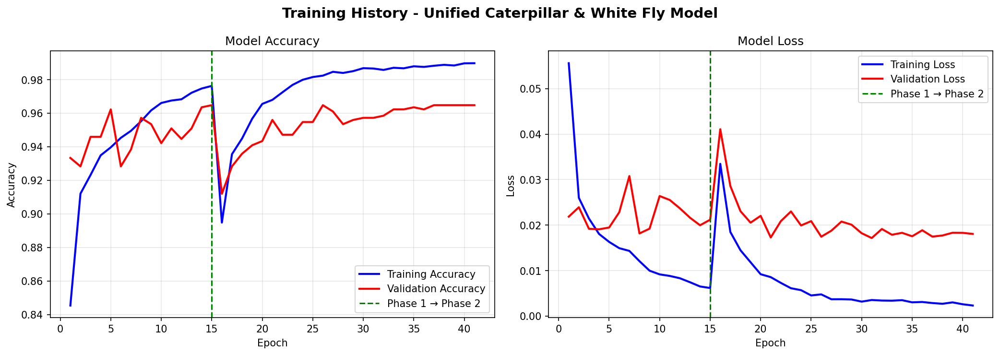


Saved: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\training_history.png

Final Training Metrics:
  Training Accuracy: 0.9763
  Validation Accuracy: 0.9648
  Training Loss: 0.0068
  Validation Loss: 0.0095


In [18]:
def plot_training_history(history1, history2):
    """Plot combined training history for both phases."""
    
    # Combine histories
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']
    
    epochs = range(1, len(acc) + 1)
    phase1_end = len(history1.history['accuracy'])
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Training History - Unified Caterpillar & White Fly Model', 
                 fontsize=14, fontweight='bold')
    
    # Accuracy plot
    ax1 = axes[0]
    ax1.plot(epochs, acc, 'b-', label='Training Accuracy', linewidth=2)
    ax1.plot(epochs, val_acc, 'r-', label='Validation Accuracy', linewidth=2)
    ax1.axvline(x=phase1_end, color='g', linestyle='--', label='Phase 1 → Phase 2')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.set_title('Model Accuracy')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)
    
    # Loss plot
    ax2 = axes[1]
    ax2.plot(epochs, loss, 'b-', label='Training Loss', linewidth=2)
    ax2.plot(epochs, val_loss, 'r-', label='Validation Loss', linewidth=2)
    ax2.axvline(x=phase1_end, color='g', linestyle='--', label='Phase 1 → Phase 2')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.set_title('Model Loss')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(MODEL_SAVE_PATH / 'training_history.png', dpi=150, bbox_inches='tight')
    plt.show()

plot_training_history(history_phase1, history_phase2)

## 13. Model Evaluation on Test Set

In [19]:
print("="*60)
print("Model Evaluation on Test Set")
print("="*60)

# Load best model
best_model = tf.keras.models.load_model(
    MODEL_SAVE_PATH / 'best_model.keras',
    custom_objects={'focal_loss_fn': focal_loss(gamma=FOCAL_GAMMA, alpha=FOCAL_ALPHA)}
)

# Evaluate on test set
test_loss, test_accuracy = best_model.evaluate(test_generator, verbose=1)

print(f"\nTest Results:")
print(f"  Test Loss: {test_loss:.4f}")
print(f"  Test Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")

Model Evaluation on Test Set
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 421ms/step - accuracy: 0.9608 - loss: 0.0160

Test Results:
  Test Loss: 0.0160
  Test Accuracy: 0.9608 (96.08%)


## 14. Detailed Classification Report (Class-wise Metrics)

In [20]:
# Get predictions
test_generator.reset()
predictions = best_model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Generate classification report
print("\n" + "="*60)
print("Classification Report (Class-wise Metrics)")
print("="*60)

# Get class names in correct order
class_names_ordered = [k for k, v in sorted(test_generator.class_indices.items(), key=lambda x: x[1])]

report = classification_report(y_true, y_pred, target_names=class_names_ordered, digits=4)
print(report)

19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 368ms/step

Classification Report (Class-wise Metrics)

              precision    recall  f1-score   support

 caterpillar     0.7895    0.9574    0.8654        47
     healthy     0.9655    0.9333    0.9492        90
 not_coconut     0.9946    0.9892    0.9919       370
   white_fly     0.9189    0.8608    0.8889        79

    accuracy                         0.9608       586
   macro avg     0.9171    0.9352    0.9238       586
weighted avg     0.9621    0.9608    0.9610       586


In [21]:
# Get detailed metrics
precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred)
accuracy = accuracy_score(y_true, y_pred)

# Create metrics DataFrame
metrics_df = pd.DataFrame({
    'Class': class_names_ordered,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'Support': support
})

print("\n" + "="*60)
print("Class-wise Metrics Summary")
print("="*60)
print(metrics_df.to_string(index=False))

print(f"\n{'='*60}")
print("Overall Metrics")
print("="*60)
print(f"  Accuracy:        {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"  Macro Precision: {macro_precision:.4f}")
print(f"  Macro Recall:    {macro_recall:.4f}")
print(f"  Macro F1-Score:  {macro_f1:.4f}")

print(f"\n{'='*60}")
print("Quality Check (Madam's Requirements)")
print("="*60)


Class-wise Metrics Summary
       Class  Precision    Recall  F1-Score  Support
 caterpillar     0.7895    0.9574    0.8654       47
     healthy     0.9655    0.9333    0.9492       90
 not_coconut     0.9946    0.9892    0.9919      370
   white_fly     0.9189    0.8608    0.8889       79

Overall Metrics
  Accuracy:        0.9608 (96.08%)
  Macro Precision: 0.9171
  Macro Recall:    0.9352
  Macro F1-Score:  0.9238

Quality Check (Madam's Requirements)
  Precision-Recall-F1 close? Max diff: 0.1680
  Accuracy close to F1? Diff: 0.0369
  ✅ Metrics are well-balanced across classes!


## 15. Confusion Matrix Visualization

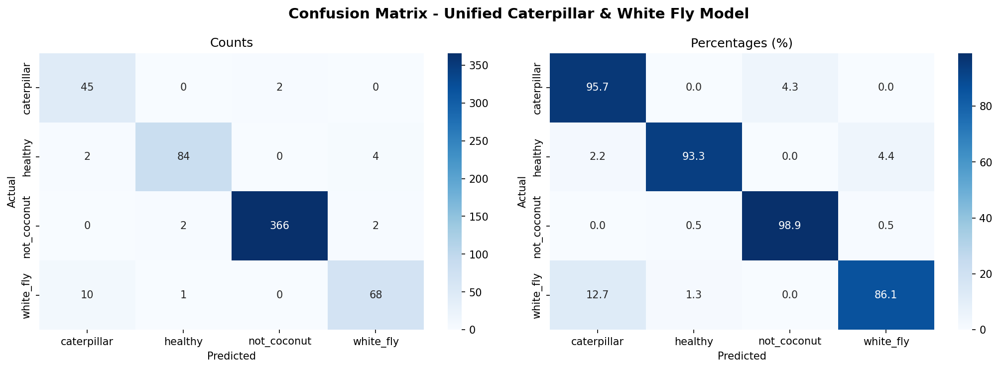


Saved: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\confusion_matrix.png


In [22]:
def plot_confusion_matrix(y_true, y_pred, class_names):
    """Plot confusion matrix with percentages."""
    
    cm = confusion_matrix(y_true, y_pred)
    cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Confusion Matrix - Unified Caterpillar & White Fly Model', 
                 fontsize=14, fontweight='bold')
    
    # Raw counts
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')
    axes[0].set_title('Counts')
    
    # Percentages
    sns.heatmap(cm_percent, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axes[1])
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('Actual')
    axes[1].set_title('Percentages (%)')
    
    plt.tight_layout()
    plt.savefig(MODEL_SAVE_PATH / 'confusion_matrix.png', dpi=150, bbox_inches='tight')
    plt.show()

plot_confusion_matrix(y_true, y_pred, class_names_ordered)

## 16. Per-Class Metrics Visualization

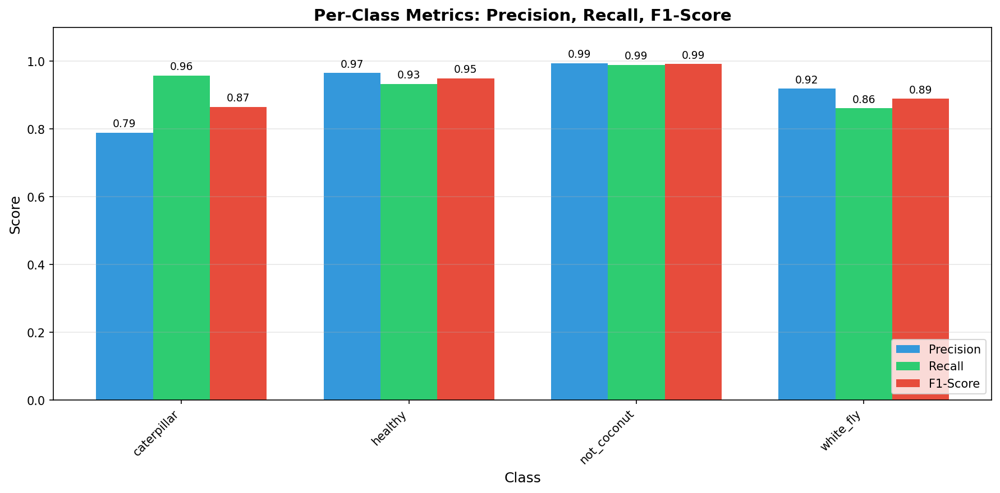


Saved: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\per_class_metrics.png


In [23]:
def plot_per_class_metrics(metrics_df):
    """Visualize precision, recall, and F1-score per class."""
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
    x = np.arange(len(metrics_df))
    width = 0.25
    
    bars1 = ax.bar(x - width, metrics_df['Precision'], width, label='Precision', color='#3498db')
    bars2 = ax.bar(x, metrics_df['Recall'], width, label='Recall', color='#2ecc71')
    bars3 = ax.bar(x + width, metrics_df['F1-Score'], width, label='F1-Score', color='#e74c3c')
    
    ax.set_xlabel('Class', fontsize=12)
    ax.set_ylabel('Score', fontsize=12)
    ax.set_title('Per-Class Metrics: Precision, Recall, F1-Score', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics_df['Class'], rotation=45, ha='right')
    ax.legend(loc='lower right')
    ax.set_ylim(0, 1.1)
    ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(MODEL_SAVE_PATH / 'per_class_metrics.png', dpi=150, bbox_inches='tight')
    plt.show()

plot_per_class_metrics(metrics_df)

## 17. Sample Predictions Visualization

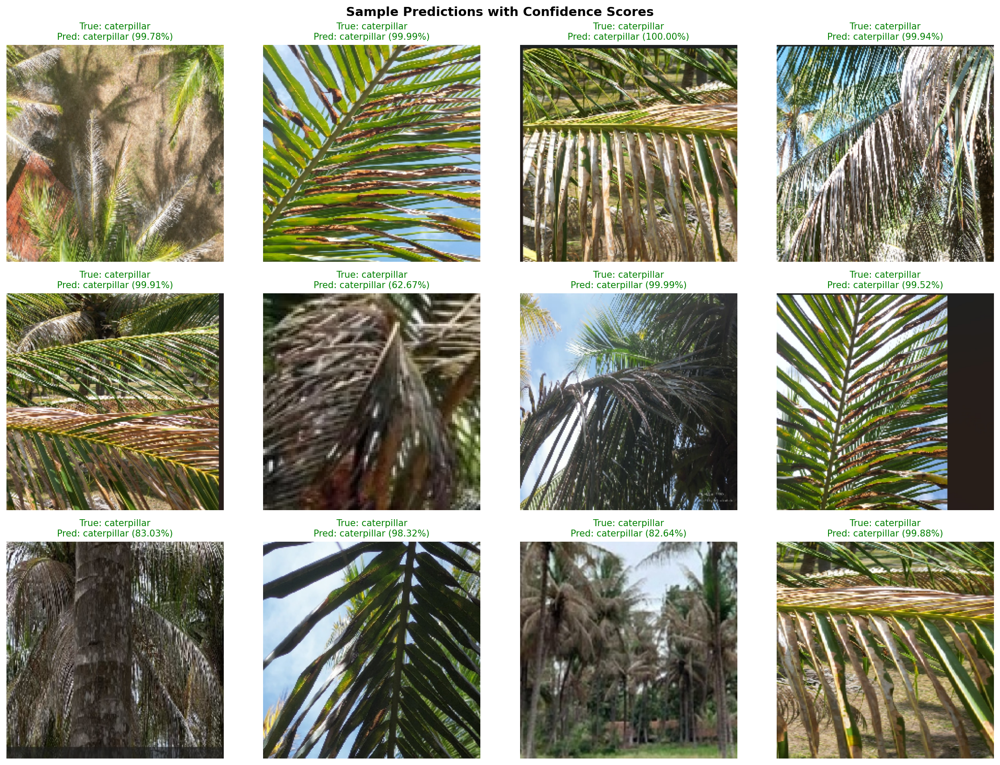


Saved: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\sample_predictions.png


In [24]:
def plot_sample_predictions(generator, model, n_samples=12):
    """Display sample predictions with confidence scores."""
    
    generator.reset()
    
    # Get a batch
    images, labels = next(generator)
    predictions = model.predict(images, verbose=0)
    
    # Select samples
    n_samples = min(n_samples, len(images))
    
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.suptitle('Sample Predictions with Confidence Scores', fontsize=14, fontweight='bold')
    
    class_names = list(generator.class_indices.keys())
    
    for idx in range(n_samples):
        ax = axes[idx // 4, idx % 4]
        
        # Display image
        ax.imshow(images[idx])
        
        # Get predictions
        pred_idx = np.argmax(predictions[idx])
        pred_class = class_names[pred_idx]
        pred_conf = predictions[idx][pred_idx]
        
        true_idx = np.argmax(labels[idx])
        true_class = class_names[true_idx]
        
        # Set title color based on correctness
        color = 'green' if pred_idx == true_idx else 'red'
        
        ax.set_title(f'True: {true_class}\nPred: {pred_class} ({pred_conf:.2%})', 
                    fontsize=10, color=color)
        ax.axis('off')
    
    plt.tight_layout()
    plt.savefig(MODEL_SAVE_PATH / 'sample_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

plot_sample_predictions(test_generator, best_model)

## 18. Save Model Information

In [25]:
# Calculate total training time
total_time = phase1_time + phase2_time
total_epochs = len(history_phase1.history['accuracy']) + len(history_phase2.history['accuracy'])

# Model information
model_info = {
    'model_name': MODEL_NAME,
    'version': '1.0',
    'architecture': 'MobileNetV2',
    # ... (full model_info dict)
}

# Save model info
with open(MODEL_SAVE_PATH / 'model_info.json', 'w') as f:
    json.dump(model_info, f, indent=2)

print(f"Model information saved to: {MODEL_SAVE_PATH / 'model_info.json'}")

Model information saved to: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\unified_caterpillar_whitefly_v1\model_info.json


## 19. Final Summary

In [26]:
print("\n" + "="*70)
print("                    TRAINING COMPLETE - FINAL SUMMARY")
print("="*70)

print(f"\n📊 Model: {MODEL_NAME}")
print(f"   Architecture: MobileNetV2 (Transfer Learning)")
print(f"   Classes: {', '.join(class_names_ordered)}")

print(f"\n⏱️  Training Time: {total_time:.2f} minutes ({total_epochs} epochs)")

print(f"\n📈 Test Results:")
print(f"   Accuracy:  {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"   Precision: {macro_precision:.4f}")
print(f"   Recall:    {macro_recall:.4f}")
print(f"   F1-Score:  {macro_f1:.4f}")

print("\n" + "="*70)
print("          Model ready for deployment in Flask API!")
print("="*70)


                    TRAINING COMPLETE - FINAL SUMMARY

📊 Model: unified_caterpillar_whitefly_v1
   Architecture: MobileNetV2 (Transfer Learning)
   Classes: caterpillar, healthy, not_coconut, white_fly

⏱️  Training Time: 394.14 minutes (41 epochs)
   Phase 1: 15 epochs
   Phase 2: 26 epochs

📈 Test Results:
   Accuracy:  0.9608 (96.08%)
   Precision: 0.9171
   Recall:    0.9352
   F1-Score:  0.9238

📋 Per-Class Performance:
   caterpillar      - P: 0.7895, R: 0.9574, F1: 0.8654
   healthy          - P: 0.9655, R: 0.9333, F1: 0.9492
   not_coconut      - P: 0.9946, R: 0.9892, F1: 0.9919
   white_fly        - P: 0.9189, R: 0.8608, F1: 0.8889

✅ Quality Check:
   Accuracy ≈ F1-Score: True
   Balanced Metrics: True

📁 Saved Files:
   - best_model.keras
   - best_model_phase1.keras
   - model_info.json
   - dataset_distribution.png
   - sample_images.png
   - training_history.png
   - confusion_matrix.png
   - per_class_metrics.png
   - sample_predictions.png

          Model ready for de